In [1]:
import tifffile
import aicsimageio as aics
import os
import pathlib
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import h5py
import dask.array as da
import napari
import glob
from skimage.morphology import binary_dilation, binary_erosion
import sys

# Plotting parameters
mpl.rcParams['axes.labelsize'] = 20
mpl.rcParams['xtick.labelsize'] = 20
mpl.rcParams['ytick.labelsize'] = 15
mpl.rcParams['axes.titlesize'] = 30

# Colors
colors = list(plt.cm.tab20.colors)
colors += list(plt.cm.tab20b.colors)
all_partners_in_collection = ['At','AeCa','BrVe','CiFr','G3','GN1','GN3','GN4','Ct','G1','G4','G5','G6','G8','AlFa','KlPn','PsFu','PsAe','PsFl','PsPs','PrRe','S1','S2','S5','SC1','SC12','SC14','SC18']
colors = colors[:len(all_partners_in_collection)]
color_dict = dict(zip(all_partners_in_collection, colors))

# Global variables
media = ["FAT_ns", "FA_ns"]
media_titles = ["FATns", "FAns"]
nmedia = 2
nreplicates=3
chan_r = 0
chan_g = 1
ring_width = 1

# Setup folders 
proj_dir = pathlib.Path(os.getcwd()).parent.parent
raw_data_dir = proj_dir / 'raw_data' / '20260601_D5_NOSALT'
proc_data_dir = proj_dir / 'processed_data' / '20260601_D5_NOSALT'
cfu_dir = proj_dir / 'cfu_counts'
if ring_width == 5:
   plot_dir = proj_dir / 'figures' / 'NOSALT'
elif ring_width == 1:
   plot_dir = proj_dir / 'figures_ring_1' / 'NOSALT'

if not os.path.exists(proc_data_dir):
   os.makedirs(proc_data_dir)

if not os.path.exists(plot_dir):
   os.makedirs(plot_dir)
   

# Import functions
sys.path.insert(0, str(proj_dir / 'code'))
from _cfu_analysis_functions import *
from _image_analysis_functions import *

## Interactions quantified from CFUs

In [2]:
# CFU counts
cfu_df = pd.read_csv(cfu_dir / 'raw_data/20260602_NOSALT.csv')
cfu_df.head()

,strain,condition,culture,partner,day,replicate,comments,dilution,count,CFUs
0,Oa,NaN,mono,NaN,0,1,NaN,4,42.0,42000
1,G3,NaN,mono,NaN,0,1,NaN,4,75.0,75000
2,GN4,NaN,mono,NaN,0,1,NaN,4,53.0,53000
3,Ct,NaN,mono,NaN,0,1,NaN,4,19.0,19000
4,G4,NaN,mono,NaN,0,1,NaN,5,5.0,50000


In [3]:
# partner identities
strains = pd.unique(cfu_df["strain"])
nstrains = len(strains)
npartners = len(strains) - 1
partners = [s for s in strains if s != "Oa"]
partners.sort()
print(partners)

['AlFa', 'Ct', 'G3', 'G4', 'GN4', 'PsAe', 'PsFu', 'S1']


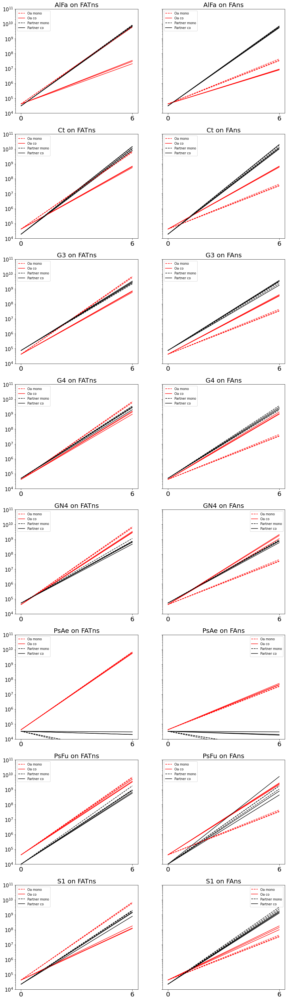

In [4]:
colors = {"Oa": "red", "partner": "black"}

d0_mono = cfu_df.query("day == 0 and culture == 'mono'").set_index("strain")["CFUs"]

fig, ax = plt.subplots(npartners, nmedia, figsize=(15, 7 * npartners), sharey=True)

for i, partner in enumerate(partners):

    for m, condition in enumerate(media):

        for rep in range(1, nreplicates + 1):

            # Oa mono
            ax[i, m].plot([0, 6],[d0_mono["Oa"],get_cfus(cfu_df, 6, condition, "mono", strain="Oa", replicate=rep)],color="red",linestyle="dashed",label="Oa mono" if rep == 1 else "")

            # Oa co
            ax[i, m].plot([0, 6],[d0_mono["Oa"],get_cfus(cfu_df, 6, condition, "co", partner=partner, replicate=rep)],color="red",label="Oa co" if rep == 1 else "")

            # Partner mono
            ax[i, m].plot([0, 6],[d0_mono[partner],get_cfus(cfu_df, 6, condition, "mono", strain=partner, replicate=rep)],color="black",linestyle="dashed",label="Partner mono" if rep == 1 else "")

            # Partner co
            ax[i, m].plot([0, 6],[d0_mono[partner],get_cfus(cfu_df, 6, condition, "co", strain=partner, partner="Oa", replicate=rep)],color="black",label="Partner co" if rep == 1 else "")

        ax[i, m].set_yscale("log")
        ax[i, m].set_ylim(1e4, 1e11)
        ax[i, m].set_title(f"{partner} on {media_titles[m]}", fontsize=20)
        ax[i,m].set_xticks([0, 6])
        ax[i, m].legend()
plt.savefig(plot_dir / "FAns_all_interactions.png", dpi=300, bbox_inches="tight")
plt.show()

In [5]:
cfu_df["oa_on_p"] = cfu_df[cfu_df["culture"]=="co"].apply(lambda row: get_p_on_oa(cfu_df,row["condition"], row["partner"], row["replicate"]), axis=1)
cfu_df["p_on_oa"] = cfu_df[cfu_df["culture"]=="co"].apply(lambda row: get_oa_on_p(cfu_df, row["condition"], row["partner"], row["replicate"]), axis=1)

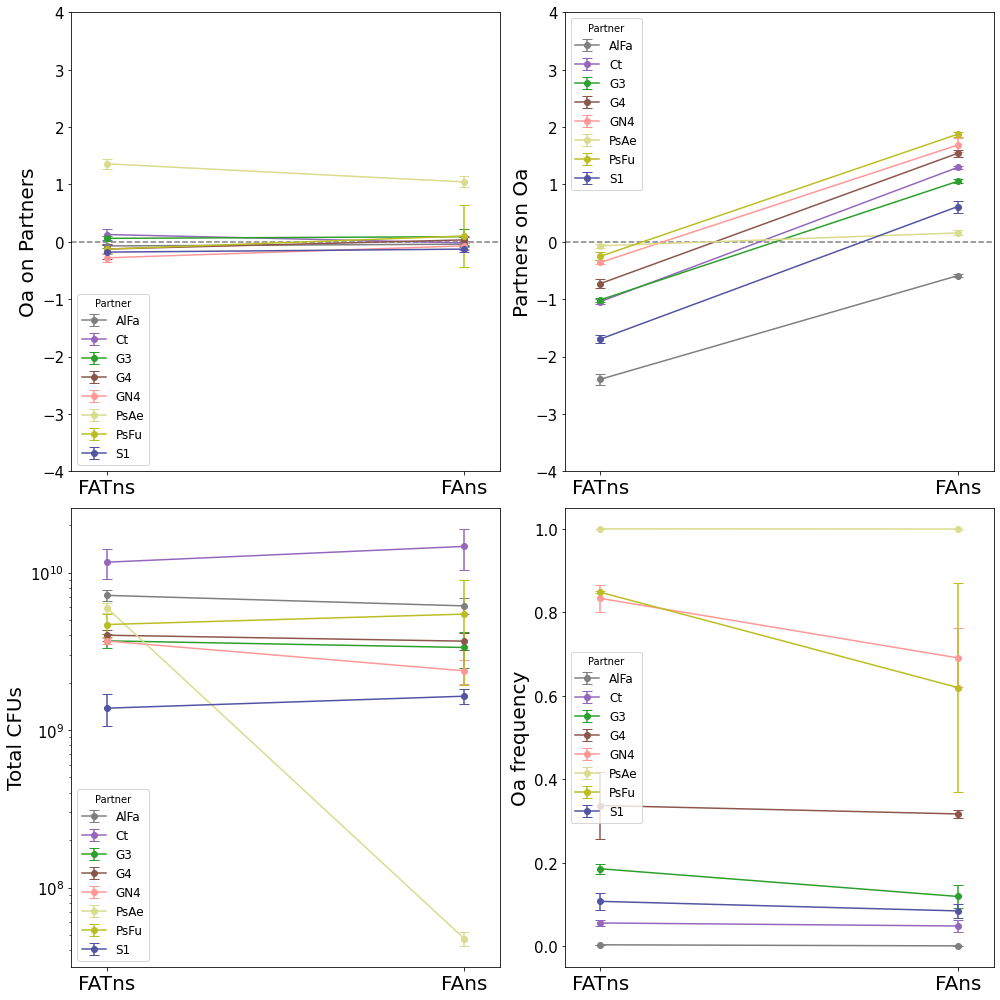

In [6]:
fig, ax = plt.subplots(ncols=2,nrows=2,figsize=(14,14))

for partner in partners:

    # Oa on Partners
    mean_oa_on_p_fat = np.mean([get_oa_on_p(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_on_p_fat = np.std([get_oa_on_p(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_oa_on_p_fa = np.mean([get_oa_on_p(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_on_p_fa = np.std([get_oa_on_p(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Partners on Oa
    mean_p_on_oa_fat = np.mean([get_p_on_oa(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_p_on_oa_fat = np.std([get_p_on_oa(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_p_on_oa_fa = np.mean([get_p_on_oa(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_p_on_oa_fa = np.std([get_p_on_oa(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Oa frequency
    mean_oa_freq_fat = np.mean([get_oa_freq(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_freq_fat = np.std([get_oa_freq(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_oa_freq_fa = np.mean([get_oa_freq(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_freq_fa = np.std([get_oa_freq(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Total CFUs
    mean_cfu_fat = np.mean([get_total_cfu(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_cfu_fat = np.std([get_total_cfu(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_cfu_fa = np.mean([get_total_cfu(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_cfu_fa = np.std([get_total_cfu(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Plots
    ax[0,0].errorbar([0, 1],[mean_oa_on_p_fat, mean_oa_on_p_fa],yerr=[std_oa_on_p_fat, std_oa_on_p_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])
    ax[0,1].errorbar([0, 1],[mean_p_on_oa_fat, mean_p_on_oa_fa],yerr=[std_p_on_oa_fat, std_p_on_oa_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,0].errorbar([0, 1],[mean_cfu_fat, mean_cfu_fa],yerr=[std_cfu_fat, std_cfu_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,1].errorbar([0, 1],[mean_oa_freq_fat, mean_oa_freq_fa],yerr=[std_oa_freq_fat, std_oa_freq_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])

ax[0,0].set_ylabel("Oa on Partners")
ax[0,1].set_ylabel("Partners on Oa")
ax[1,0].set_ylabel("Total CFUs")
ax[1,1].set_ylabel("Oa frequency")
ax[0,0].axhline(0, color="gray", linestyle="dashed")
ax[0,1].axhline(0, color="gray", linestyle="dashed")
ax[0,0].set_ylim(-4, 4)
ax[0,1].set_ylim(ax[0,0].get_ylim())
ax[1,0].set_yscale("log")

for a in ax.flatten():
    a.set_xticks([0, 1])
    a.set_xticklabels(media_titles)
    a.set_xlim(-0.1, 1.1)
    a.legend(title="Partner",fontsize=12)

plt.tight_layout()
plt.savefig(plot_dir / "FAns_interactions_cfus_summary.png")
plt.show()

## Full colonies

In [7]:
# Image paths
paths_full_fa = glob.glob(str(raw_data_dir / 'FullCols' / '*FA.czi'))
paths_full_fa.sort()
paths_full_fat = glob.glob(str(raw_data_dir / 'FullCols' / '*FAT.czi'))
paths_full_fat.sort()
print(paths_full_fa)
print(paths_full_fat)
if len(paths_full_fa) != len(paths_full_fat):
    raise ValueError("Number of FA and FAT full colony images do not match.")

['/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/AlFa_FA.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/Ct_FA.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/G3_FA.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/G4_FA.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/GN4_FA.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/PsAe_FA.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/PsFu_FA.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/S1_FA.czi']
['/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/AlFa_FAT.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260601_D5_NOSALT/FullCols/Ct_FAT.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/2026

In [8]:
# Load images
ims_full_fa = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_full_fa]
ims_full_fat = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_full_fat]

# Get partner names from image paths
partners = [s.replace(str(raw_data_dir),'').replace('/FullCols/','') for s in paths_full_fa]
partners = [s.replace('_FA.czi','') for s in partners]
print(partners)
npartners = len(partners)

['AlFa', 'Ct', 'G3', 'G4', 'GN4', 'PsAe', 'PsFu', 'S1']


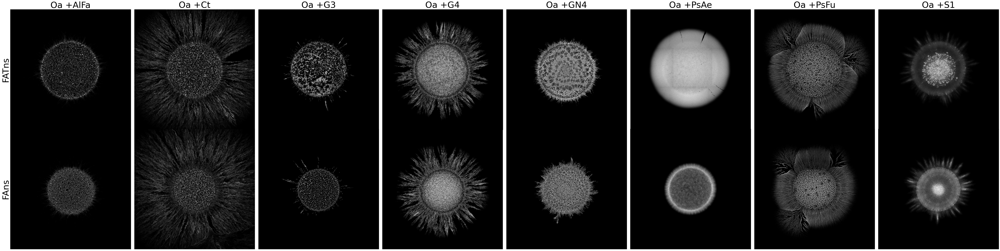

In [9]:
# Plot full colonies
option = "horizontal"
if option == "vertical":
    fig, ax = plt.subplots(nrows=npartners, ncols=2, figsize=(20, 10*npartners))
    for i in range(npartners):
        ax[i,0].imshow(ims_full_fat[i][chan_r,:,:],cmap="gray")
        ax[i,1].imshow(ims_full_fa[i][chan_r,:,:],cmap="gray")
        ax[i,0].set_title("Oa +" + partners[i] + " on FATns",fontsize=20)
        ax[i,1].set_title("Oa +" + partners[i] + " on FAns",fontsize=20)
        ax[i,0].axis('off')
        ax[i,1].axis('off')
elif option == "horizontal":
    fig, ax = plt.subplots(nrows=2, ncols=npartners, figsize=(10*npartners, 20))
    for i in range(npartners):
        ax[0,i].imshow(ims_full_fat[i][chan_r,:,:],cmap="gray")
        ax[1,i].imshow(ims_full_fa[i][chan_r,:,:],cmap="gray")
        ax[0,i].set_title("Oa +" + partners[i],fontsize=50)
        ax[0,i].set_xticks([])
        ax[1,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[1,i].set_yticks([])
    ax[0,0].set_ylabel("FATns",fontsize=50)
    ax[1,0].set_ylabel("FAns",fontsize=50)
plt.savefig(plot_dir / f"FAns_full_colonies_{option}.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()

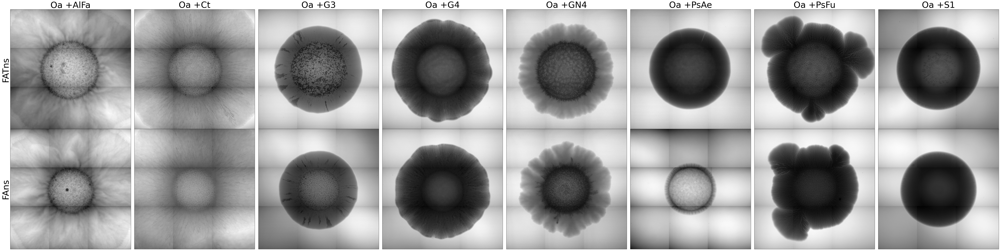

In [10]:
# Plot full colonies
option = "horizontal"
if option == "vertical":
    fig, ax = plt.subplots(nrows=npartners, ncols=2, figsize=(20, 10*npartners))
    for i in range(npartners):
        ax[i,0].imshow(ims_full_fat[i][chan_g,:,:],cmap="gray")
        ax[i,1].imshow(ims_full_fa[i][chan_g,:,:],cmap="gray")
        ax[i,0].set_title("Oa +" + partners[i] + " on FATns",fontsize=20)
        ax[i,1].set_title("Oa +" + partners[i] + " on FAns",fontsize=20)
        ax[i,0].axis('off')
        ax[i,1].axis('off')
elif option == "horizontal":
    fig, ax = plt.subplots(nrows=2, ncols=npartners, figsize=(10*npartners, 20))
    for i in range(npartners):
        ax[0,i].imshow(ims_full_fat[i][chan_g,:,:],cmap="gray")
        ax[1,i].imshow(ims_full_fa[i][chan_g,:,:],cmap="gray")
        ax[0,i].set_title("Oa +" + partners[i],fontsize=50)
        ax[0,i].set_xticks([])
        ax[1,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[1,i].set_yticks([])
    ax[0,0].set_ylabel("FATns",fontsize=50)
    ax[1,0].set_ylabel("FAns",fontsize=50)
plt.savefig(plot_dir / f"FAns_full_colonies_esid_{option}.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()

## Closeups

In [11]:
# Image paths for closeups
paths_closeup_fa = glob.glob(str(raw_data_dir / 'CloseUps' / '*FA_*.czi'))
paths_closeup_fat = glob.glob(str(raw_data_dir / 'CloseUps' / '*FAT_*.czi'))
if len(paths_closeup_fa) != len(paths_closeup_fat):
    raise ValueError("Number of FA and FAT closeup images do not match.")
paths_closeup_fa.sort()
paths_closeup_fat.sort()

# Load closeup images
ims_closeup_fa = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_closeup_fa]
ims_closeup_fat = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_closeup_fat]

# Normalize closeup images if they do not already exist otherwise load them
generate_normalized = False
if generate_normalized:
    ims_closeup_fa_norm = [normalize_image_global(img[chan_r]) for img in ims_closeup_fa]
    ims_closeup_fat_norm = [normalize_image_global(img[chan_r]) for img in ims_closeup_fat]

    # Save normalized closeup image
    savenames_fa = [pathlib.Path(path).name.replace("FA_", "closeup_norm_FAns_").replace(".czi", ".tiff") for path in paths_closeup_fa]
    savenames_fat = [pathlib.Path(path).name.replace("FAT_", "closeup_norm_FATns_").replace(".czi", ".tiff") for path in paths_closeup_fat]

    for i in range(len(ims_closeup_fa_norm)):
        tifffile.imwrite(proc_data_dir / savenames_fa[i], ims_closeup_fa_norm[i])
        tifffile.imwrite(proc_data_dir / savenames_fat[i], ims_closeup_fat_norm[i])
else:
    # Load normalized closeup images
    norm_paths_fa = glob.glob(str(proc_data_dir / '*closeup_norm_FAns_*.tiff'))
    norm_paths_fat = glob.glob(str(proc_data_dir / '*closeup_norm_FATns_*.tiff'))
    if len(norm_paths_fa) != len(norm_paths_fat):
        raise ValueError("Number of FA and FAT normalized closeup images do not match.")
    else:
        print(f"Found {len(norm_paths_fa)} normalized FA closeup images and {len(norm_paths_fat)} normalized FAT closeup images.")
    norm_paths_fa.sort()
    norm_paths_fat.sort()

    ims_closeup_fa_norm = [tifffile.imread(path) for path in norm_paths_fa]
    ims_closeup_fat_norm = [tifffile.imread(path) for path in norm_paths_fat]

Found 24 normalized FA closeup images and 24 normalized FAT closeup images.


In [12]:
# Partner names for closeups
partners = [s.replace(str(raw_data_dir),'').replace('/FullCols/','') for s in paths_full_fa] # easier to get from full colony images since there is only one replicate
partners = [s.replace('_FA.czi','') for s in partners]
partners = sorted(partners) # sort alphabetically to make sure the order is the same as in the closeup images
print(partners)

['AlFa', 'Ct', 'G3', 'G4', 'GN4', 'PsAe', 'PsFu', 'S1']


Partner PsAe has mean Oa frequency in FA of 1.00


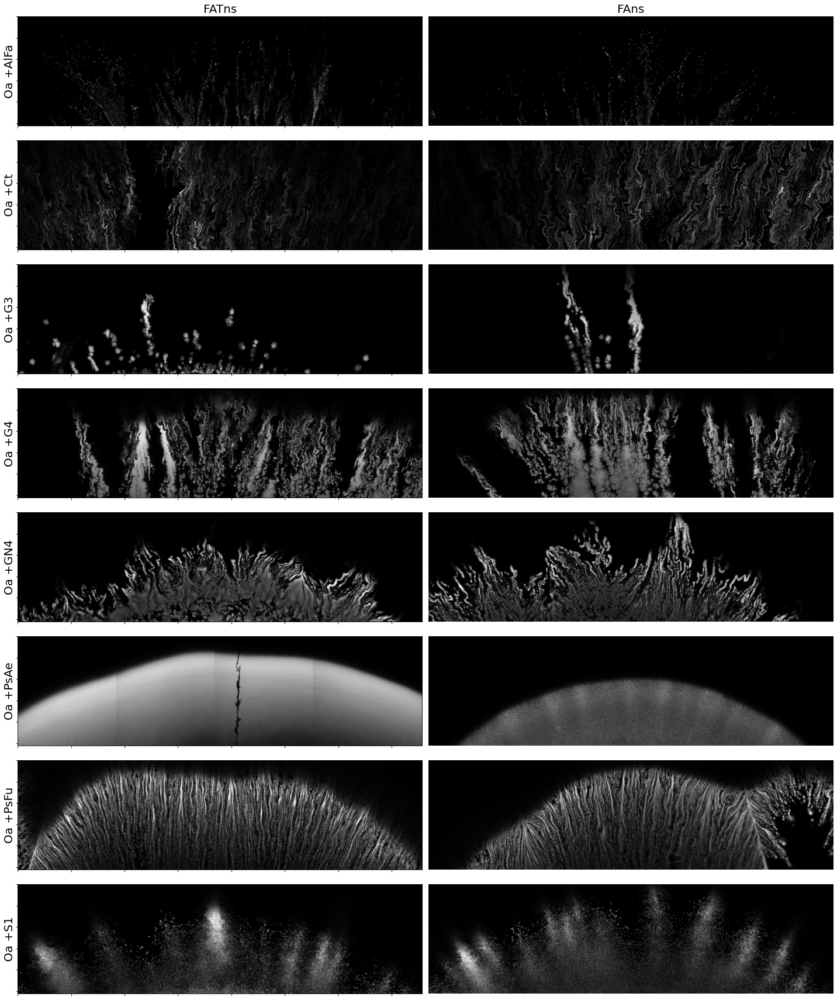

In [13]:
# Print normalized images
# Note that I am plotting the first replicate
option = "vertical"
if option == "vertical":
    fig, ax = plt.subplots(8, 2, figsize=(10*2,3*8))
    for i in range(8):
        mean_oa_freq_fa = np.mean([get_oa_freq(cfu_df, media[1], partners[i], rep) for rep in range(1, nreplicates + 1)])
        if mean_oa_freq_fa > 0.9:
            print(f"Partner {partners[i]} has mean Oa frequency in FA of {mean_oa_freq_fa:.2f}")
        ax[i,0].imshow(ims_closeup_fat_norm[3*i],cmap='gray')
        ax[i,1].imshow(ims_closeup_fa_norm[3*i],cmap='gray')
        ax[i,0].set_ylabel("Oa +" + partners[i],fontsize=20)
        ax[i,1].set_ylabel("")
        ax[i,0].tick_params(axis='x', labelbottom=False)  # Hide x tick labels
        ax[i,0].tick_params(axis='y', labelleft=False)    # Hide y tick labels
        ax[i,1].axis('off')
    ax[0,0].set_title(media_titles[0],fontsize=20)
    ax[0,1].set_title(media_titles[1],fontsize=20)
elif option == "horizontal":
    fig, ax = plt.subplots(2, 8, figsize=(3*8, 2))
    for i in range(8):
        ax[0,i].imshow(ims_closeup_fat_norm[3*i],cmap='gray')
        ax[1,i].imshow(ims_closeup_fa_norm[3*i],cmap='gray')
        ax[0,i].set_title("Oa +" + partners[i],fontsize=20)
        ax[0,i].set_xticks([])
        ax[1,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[1,i].set_yticks([])
    ax[0,0].set_ylabel(media_titles[0],fontsize=20)
    ax[1,0].set_ylabel(media_titles[1],fontsize=20)
plt.savefig(plot_dir / f"{media_titles[1]}_closeups.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()

## Load probabilities from Ilastik project

In [14]:
fat_prob_paths = [str(str(proc_data_dir) + "/" + partner + f"_closeup_norm_FATns_{i}_Probabilities.h5") for i in range(1,nreplicates+1) for partner in partners]
fa_prob_paths = [str(str(proc_data_dir) + "/" + partner + f"_closeup_norm_FAns_{i}_Probabilities.h5") for i in range(1,nreplicates+1) for partner in partners]
fat_prob_paths.sort()
fa_prob_paths.sort()
if len(fat_prob_paths) != len(fa_prob_paths):
    raise ValueError("Number of FA and FAT probability files do not match.")
else:
    print(f"Found {len(fat_prob_paths)} FAT probability files and {len(fa_prob_paths)} FA probability files.")

Found 24 FAT probability files and 24 FA probability files.


In [15]:
thresholds_to_try = np.linspace(0,1,101)
chosen_thr = 80 #67

# Load all probabilities
fat_prob = [h5py.File(fat_prob_paths[i], 'r')['exported_data'][:,:,0] for i in range(nreplicates*npartners)]
fa_prob = [h5py.File(fa_prob_paths[i], 'r')['exported_data'][:,:,0] for i in range(nreplicates*npartners)]
if len(fat_prob) != len(fa_prob):
    raise ValueError("Number of FAT and FA probability images do not match.")
else:
    print(f"Loaded {len(fat_prob)} FAT and {len(fa_prob)} FA probability images.")
    
# Calculate masks
mask_fat = [(prob > thresholds_to_try[chosen_thr]).astype(int) for prob in fat_prob]
mask_fa = [(prob > thresholds_to_try[chosen_thr]).astype(int) for prob in fa_prob]

Loaded 24 FAT and 24 FA probability images.


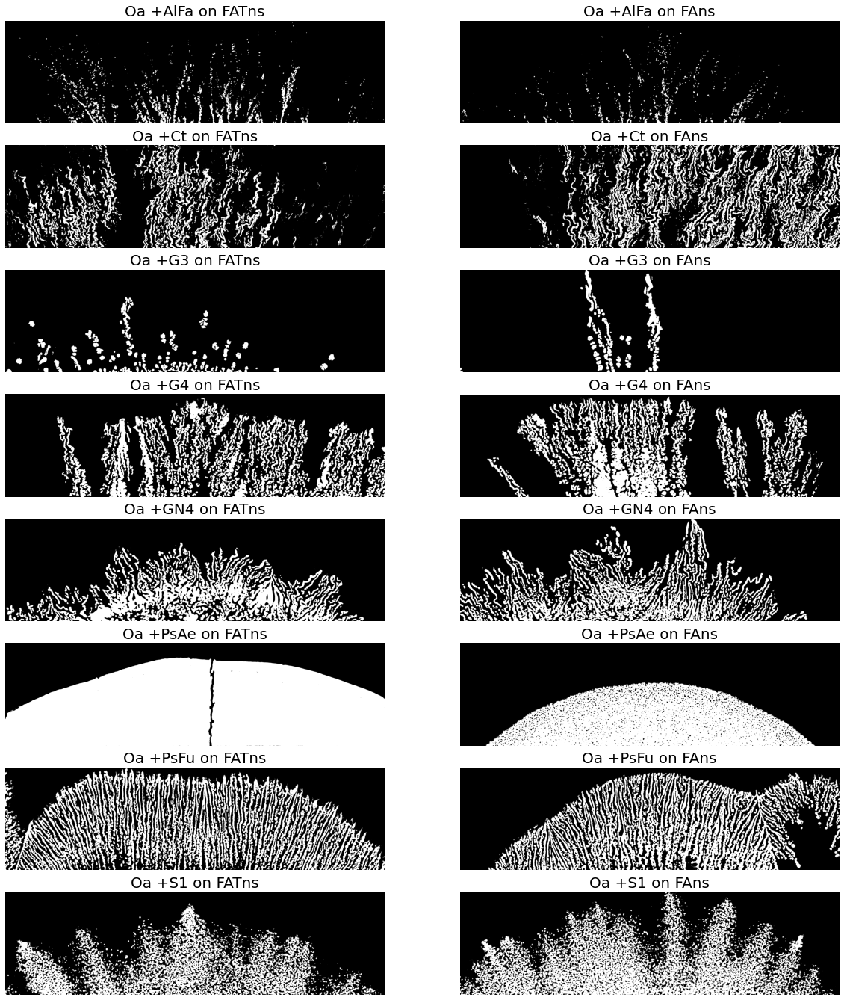

In [16]:
fig, ax = plt.subplots(npartners,2,figsize=(10*2,3*npartners))
for i in range(npartners):
    ax[i,0].imshow(mask_fat[3*i],cmap='gray')
    ax[i,1].imshow(mask_fa[3*i],cmap='gray')
    ax[i,0].set_title("Oa +" + partners[i] + " on FATns",fontsize=20)
    ax[i,1].set_title("Oa +" + partners[i] + " on FAns",fontsize=20)
    ax[i,0].axis('off')
    ax[i,1].axis('off')
plt.show()

## Load in-focus masks

In [17]:
partners.sort()
partners

['AlFa', 'Ct', 'G3', 'G4', 'GN4', 'PsAe', 'PsFu', 'S1']

In [18]:
fat_focus_mask_paths = [str(str(proc_data_dir) + "/" + partner + f"_focus_mask_FATns_{i}.tiff") for i in range(1,nreplicates+1) for partner in partners]
fa_focus_mask_paths = [str(str(proc_data_dir) + "/" + partner + f"_focus_mask_FAns_{i}.tiff") for i in range(1,nreplicates+1) for partner in partners]
fat_focus_mask_paths.sort()
fa_focus_mask_paths.sort()
if len(fat_focus_mask_paths) != len(fa_focus_mask_paths):
    raise ValueError("Number of Glu and GluT focus mask images do not match.")
else:
    print(f"Found {len(fat_focus_mask_paths)} GluT focus mask images and {len(fa_focus_mask_paths)} Glu focus mask images.")

focus_masks_fat = [tifffile.imread(fat_focus_mask_paths[i]) for i in range(len(fat_focus_mask_paths))]
focus_masks_fa = [tifffile.imread(fa_focus_mask_paths[i]) for i in range(len(fa_focus_mask_paths))]

Found 24 GluT focus mask images and 24 Glu focus mask images.


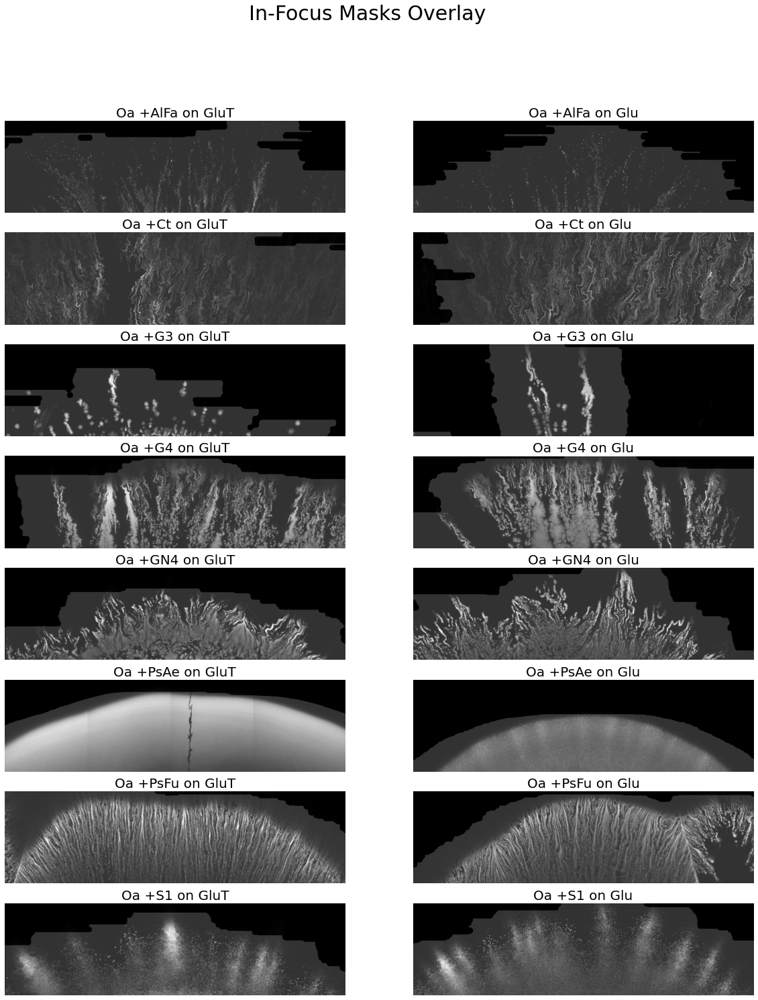

In [19]:
fig, ax = plt.subplots(npartners,2,figsize=(10*2,3*npartners))
for i in range(npartners):
    ax[i,0].imshow(ims_closeup_fat_norm[3*i],cmap='gray')
    ax[i,0].imshow(focus_masks_fat[3*i],cmap='gray',alpha=0.2)
    ax[i,1].imshow(ims_closeup_fa_norm[3*i],cmap='gray')
    ax[i,1].imshow(focus_masks_fa[3*i],cmap='gray',alpha=0.2)
    ax[i,0].set_title("Oa +" + partners[i] + " on GluT",fontsize=20)
    ax[i,1].set_title("Oa +" + partners[i] + " on Glu",fontsize=20)
    ax[i,0].axis('off')
    ax[i,1].axis('off')
plt.suptitle("In-Focus Masks Overlay",fontsize=30)
plt.show()

## Mixing and sector sizes

In [20]:
# Create a dataframe with partners, replicates, media, intermixing, ring, sector size Oa, sector size Partner, Oa frequency
ii_df = pd.DataFrame(columns=["partner", "media", "replicate", "intermixing_indices", "rings", "mean_intermixing", "sector_size_Oa", "sector_size_partner", "oa_frequency"])

for i, partner in enumerate(partners):
    for m, condition in enumerate(media):
        for rep in range(1, nreplicates + 1):

            print(f"Processing {partner} on {condition}, replicate {rep}...")

            if condition == "FAT_ns":
                #focus_mask = focus_masks_fat[i*nreplicates + (rep-1)]
                oa_mask = mask_fat[i*nreplicates + (rep-1)]
                focus_mask = np.ones_like(oa_mask).astype(bool)

            elif condition == "FA_ns":
                #focus_mask = focus_masks_fa[i*nreplicates + (rep-1)]
                oa_mask = mask_fa[i*nreplicates + (rep-1)]
                focus_mask = np.ones_like(oa_mask).astype(bool)

            # if partner == "G3":
            #     continue  # Skip G3 because mask in nan
            # if partner == "AlFa":
            #     continue  # Skip AlFa because mask in nan

            ring_distances, pixel_values = get_arcs_in_focus(focus_mask, oa_mask, ring_width=ring_width)
            intermixing_indices = intermixing_index(pixel_values)
            mean_intermixing = np.mean(intermixing_indices[int(0.5*len(intermixing_indices)):])  # mean intermixing index for the outer half of the colony  
            oa_sector_size, partner_sector_size, oa_frequency = sector_size_and_freq(pixel_values)
            oa_sector_size = np.mean(oa_sector_size)
            partner_sector_size = np.mean(partner_sector_size)

            ii_df.loc[len(ii_df)] = [partner, condition, rep, intermixing_indices, ring_distances, mean_intermixing, oa_sector_size, partner_sector_size, oa_frequency]

ii_df.head(2)

Processing AlFa on FAT_ns, replicate 1...
Processing AlFa on FAT_ns, replicate 2...
Processing AlFa on FAT_ns, replicate 3...
Processing AlFa on FA_ns, replicate 1...
Processing AlFa on FA_ns, replicate 2...
Processing AlFa on FA_ns, replicate 3...
Processing Ct on FAT_ns, replicate 1...
Processing Ct on FAT_ns, replicate 2...
Processing Ct on FAT_ns, replicate 3...
Processing Ct on FA_ns, replicate 1...
Processing Ct on FA_ns, replicate 2...
Processing Ct on FA_ns, replicate 3...
Processing G3 on FAT_ns, replicate 1...
Processing G3 on FAT_ns, replicate 2...
Processing G3 on FAT_ns, replicate 3...
Processing G3 on FA_ns, replicate 1...
Processing G3 on FA_ns, replicate 2...
Processing G3 on FA_ns, replicate 3...
Processing G4 on FAT_ns, replicate 1...
Processing G4 on FAT_ns, replicate 2...
Processing G4 on FAT_ns, replicate 3...
Processing G4 on FA_ns, replicate 1...
Processing G4 on FA_ns, replicate 2...
Processing G4 on FA_ns, replicate 3...
Processing GN4 on FAT_ns, replicate 1...

,partner,media,replicate,intermixing_indices,rings,mean_intermixing,sector_size_Oa,sector_size_partner,oa_frequency
0,AlFa,FAT_ns,1,"[0.24594299400761419, 0.26438871855818524, 0.2...","[50.5, 51.5, 52.5, 53.5, 54.5, 55.5, 56.5, 57....",0.054473,8.297479,438.478696,0.044944
1,AlFa,FAT_ns,2,"[0.22523341407926542, 0.2064639629059933, 0.20...","[50.5, 51.5, 52.5, 53.5, 54.5, 55.5, 56.5, 57....",0.052602,8.483350,524.421299,0.044131


Plotting intermixing index for AlFa...
Plotting intermixing index for Ct...
Plotting intermixing index for G3...
Plotting intermixing index for G4...
Plotting intermixing index for GN4...
Plotting intermixing index for PsAe...
Plotting intermixing index for PsFu...
Plotting intermixing index for S1...


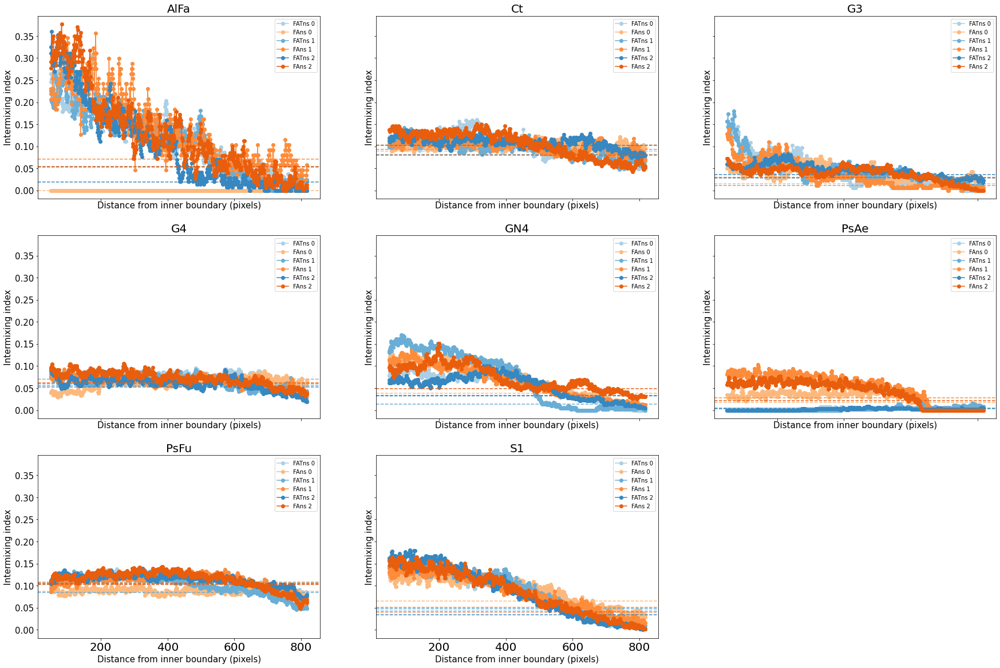

In [21]:
blues = sns.color_palette("Blues", 5)[1:4]      
oranges = sns.color_palette("Oranges", 5)[1:4]
fig, axs = plt.subplots(3,3,figsize=(30,20),sharex=True, sharey=True)
ax = axs.flatten()
for i,partner in enumerate(partners):

    print(f"Plotting intermixing index for {partner}...")
    # if partner == "G3":
    #     continue  # Skip G3 because mask in nan
    # if partner == "AlFa":   
    #     continue  # Skip AlFa because mask in nan
    idx = partners.index(partner)
    for rep in range(nreplicates):
        row_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="FAT_ns") & (ii_df["replicate"]==rep+1)]
        row_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="FA_ns") & (ii_df["replicate"]==rep+1)]
        ring_distances_fat = row_fat["rings"].values[0]
        intermixing_fat = row_fat["intermixing_indices"].values[0]
        mean_intermixing_fat = row_fat["mean_intermixing"].values[0]
        ring_distances_fa = row_fa["rings"].values[0]
        intermixing_fa = row_fa["intermixing_indices"].values[0]
        mean_intermixing_fa = row_fa["mean_intermixing"].values[0]
        ax[i].plot(ring_distances_fat, intermixing_fat, marker='o',label=f"FATns {rep}", color=blues[rep])
        ax[i].axhline(y=mean_intermixing_fat, color=blues[rep], linestyle='--')
        ax[i].plot(ring_distances_fa, intermixing_fa, marker='o',label=f"FAns {rep}", color=oranges[rep])
        ax[i].axhline(y=mean_intermixing_fa, color=oranges[rep], linestyle='--')
    ax[i].set_title(f"{partner}", fontsize=20)
    ax[i].set_xlabel("Distance from inner boundary (pixels)", fontsize=15)
    ax[i].set_ylabel("Intermixing index", fontsize=15)
    ax[i].legend()
for i in range(npartners, len(ax)):
    ax[i].axis('off')
plt.savefig(plot_dir / "FAns_intermixing_vs_pixel.png", dpi=300, bbox_inches="tight")
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/tmp/ipykernel_24418/2038140367.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


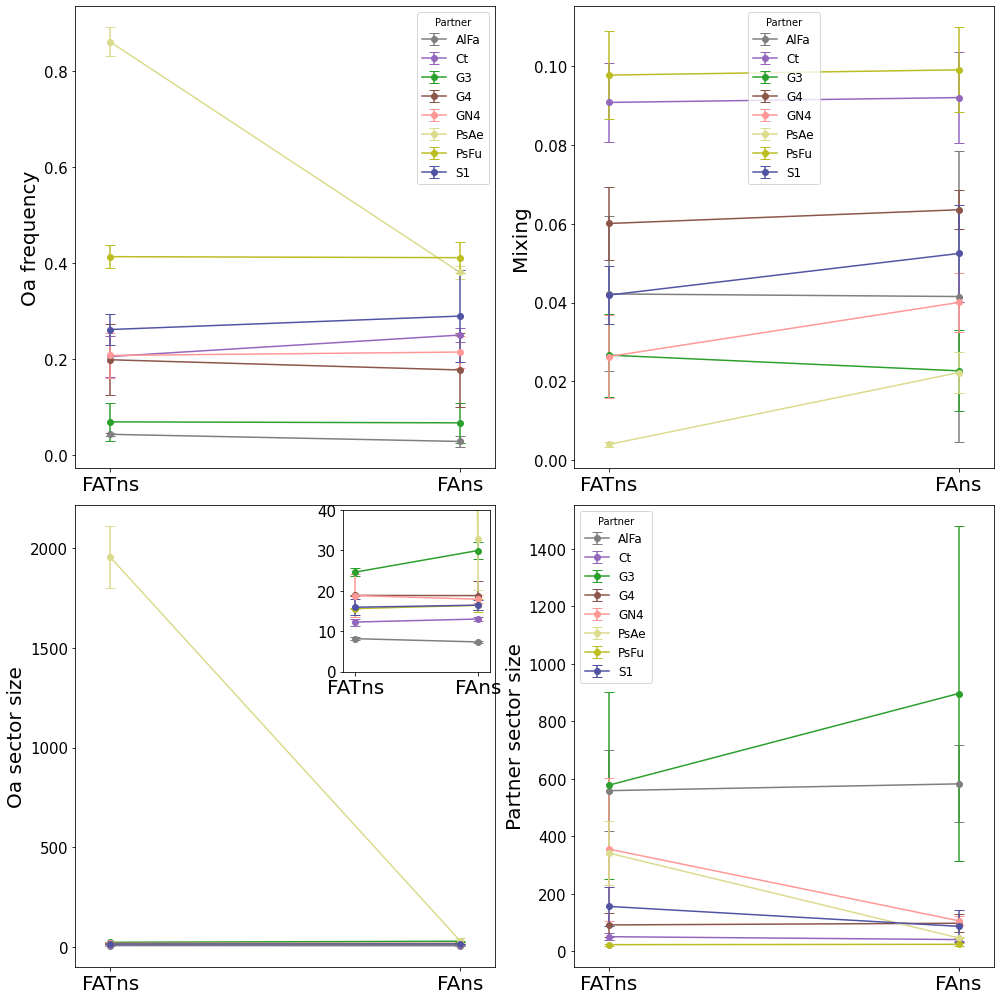

In [22]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(ncols=2,nrows=2,figsize=(14,14))
# Create inset in the top-right corner of Oa sector size plot
axins = inset_axes(ax[1,0], width="35%", height="35%", loc="upper right")

for partner in partners:

    # if (partner == "G3") | (partner == "AlFa"):
    #     continue  # Skip G3 and AlFa because mask in nan

    # Oa frequency
    mean_oa_freq_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["oa_frequency"].mean()
    std_oa_freq_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["oa_frequency"].std()
    mean_oa_freq_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["oa_frequency"].mean()
    std_oa_freq_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["oa_frequency"].std()

    # Mixing
    mean_mixing_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["mean_intermixing"].mean()
    std_mixing_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["mean_intermixing"].std()
    mean_mixing_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["mean_intermixing"].mean()
    std_mixing_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["mean_intermixing"].std()

    # Oa sector size
    mean_oa_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["sector_size_Oa"].mean()
    std_oa_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["sector_size_Oa"].std()
    mean_oa_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["sector_size_Oa"].mean()  
    std_oa_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["sector_size_Oa"].std()

    # Partner sector size
    mean_partner_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["sector_size_partner"].mean()
    std_partner_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[0])]["sector_size_partner"].std()
    mean_partner_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["sector_size_partner"].mean()
    std_partner_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]==media[1])]["sector_size_partner"].std()

    # Plots
    ax[0,0].errorbar([0, 1],[mean_oa_freq_fat, mean_oa_freq_fa],yerr=[std_oa_freq_fat, std_oa_freq_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])
    ax[0,1].errorbar([0, 1],[mean_mixing_fat, mean_mixing_fa],yerr=[std_mixing_fat, std_mixing_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,0].errorbar([0, 1],[mean_oa_sector_size_fat, mean_oa_sector_size_fa],yerr=[std_oa_sector_size_fat, std_oa_sector_size_fa],marker="o",linestyle="-",capsize=5,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,1].errorbar([0, 1],[mean_partner_sector_size_fat, mean_partner_sector_size_fa],yerr=[std_partner_sector_size_fat, std_partner_sector_size_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])
    axins.errorbar([0, 1],[mean_oa_sector_size_fat, mean_oa_sector_size_fa],yerr=[std_oa_sector_size_fat, std_oa_sector_size_fa],marker="o",linestyle="-",capsize=5,color=color_dict[partner],ecolor=color_dict[partner])  

ax[0,0].set_ylabel("Oa frequency")
ax[0,1].set_ylabel("Mixing")
ax[1,0].set_ylabel("Oa sector size")
ax[1,1].set_ylabel("Partner sector size")
axins. set_ylim(0,40)
axins.set_xticks([0, 1])
axins.set_xticklabels(media_titles)
axins.set_xlim(-0.1, 1.1)

for a in ax.flatten():
    a.set_xticks([0, 1])
    a.set_xticklabels(media_titles)
    a.set_xlim(-0.1, 1.1)
    a.legend(title="Partner",fontsize=12)

plt.tight_layout()
plt.savefig(plot_dir / "FAns_image_analysis_summary.png")
plt.show()

In [23]:
# Save ii_df as csv
if ring_width == 5:
    ii_df.to_csv("fa_ns_image_analysis.csv", index=False)
elif ring_width == 1:
    ii_df.to_csv("fa_ns_image_analysis_ring_1.csv", index=False)
